# Load library

In [77]:
import numpy as np
import pandas as pd
import xarray as xr
import rasterio
import matplotlib.pyplot as plt
from joblib import dump, load
from extract_func.Extract_PTE_function import *
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar

# Load ML model

In [2]:
import tensorflow as tf
model = tf.keras.models.load_model('Model/global_PTE_fixed_hgtlvs_02_20_model/')
rf_model = load('Model/Global_PTE_fixed_hgtlvs_RF.joblib')

2023-04-08 21:04:11.549483: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
scaler = load('Scaler/global_MinMax_scaler_x.bin')

/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:288: UserWarning: Trying to unpickle estimator MinMaxScaler from version 1.0.2 when using version 1.2.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


# Test on InSAR application

For the testing of InSAR application of the trained model, we take the area of Pennsylvania and compare the performance of RF, NN, and RAiDER prediction

# Pennsylvania

In [5]:
import glob
import rasterio
import numpy as np
import pandas as pd

In [6]:
weather_file_path = '../InSAR/Pennsylvania/WM_files/'
uw_ifg = '../InSAR/Pennsylvania/Extracted/unwrappedPhase/'
coh_ifg = '../InSAR/Pennsylvania/Extracted/coherence/'

In [7]:
dates = glob.glob(uw_ifg+'????????_????????') # get all the ifg
dates.sort() # Sort the ifg by date order

In [8]:
ifg__ = rasterio.open(dates[::2][0])
ifg__.bounds

BoundingBox(left=-79.9608333333334, bottom=38.7641666666667, right=-75.9608333333334, top=43.2716666666667)

## Preprocessing for getting ifg

In here to search for the ifg with average coherent higher than 0.8
The for loop below is to calculate the average coherenet for each ifg. The selected date_pair with append to the list.

In [16]:
coh_list = []
for path in glob.glob(coh_ifg+'*[0-9].vrt'):
    with rasterio.open(path) as file:
        coh_ = file.read(1)
        coh_[coh_==0] = np.nan
        avg_coh = np.nanmean(coh_)
        if avg_coh > 0.8:
            coh_list.append(path.split('/')[-1].split('.')[0])
        else:
            pass

In [17]:
ifg_list = [e for e in coh_list if e in [i.split('/')[-1] for i in dates]] # Only picking the ifg that have high coherent
ifg_list.sort()
ifg_list

['20200212_20200131',
 '20200307_20200224',
 '20200319_20200307',
 '20200331_20200319',
 '20200412_20200331',
 '20200424_20200412',
 '20200506_20200424',
 '20201126_20201114']

In [11]:
wm_date = [i.split('_') for i in ifg_list]
wm_date = [item for sublist in wm_date for item in sublist] # Double for loop to get the date for each ifg
wm_date.sort()
wm_date

['20200131',
 '20200212',
 '20200224',
 '20200307',
 '20200307',
 '20200319',
 '20200319',
 '20200331',
 '20200331',
 '20200412',
 '20200412',
 '20200424',
 '20200424',
 '20200506',
 '20201114',
 '20201126']

In [23]:
import matplotlib.font_manager as fm
fontprops = fm.FontProperties(size=15)

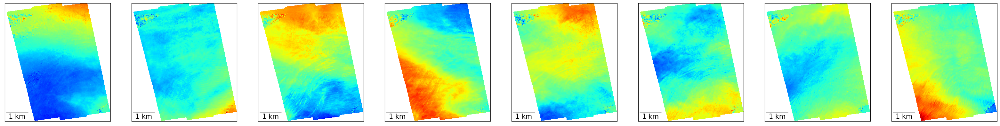

In [26]:
IFG = []
fig, axes = plt.subplots(1, len(ifg_list), figsize=(40,15))
for i, date in enumerate(ifg_list):
    ifg_path = uw_ifg+date
    # coh_path = coh_ifg+date+'.vrt'
    # with rasterio.open(coh_path) as file:
    #     coh = file.read(1)
    #     mask = coh>0.5
    try:
        with rasterio.open(ifg_path) as file:
            ifg = file.read(1)
            ifg[ifg==0.0] = np.nan
            # ifg[~mask] = np.nan
            ifg = convert_rad(ifg, 5.6/100)
            a = axes[i].imshow(ifg, cmap='jet')
            
            # axes[i].title.set_text(date)
            scalebar = AnchoredSizeBar(axes[i].transData,
                           1000, '1 km', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fontprops)

            axes[i].add_artist(scalebar)
            axes[i].set_xticks([])
            axes[i].set_yticks([])
            IFG.append(ifg)
    except:
        continue
    """ Iterate column's axes"""
# axes.colorbar(a, label='(m)', orientation='horizontal')
plt.show()

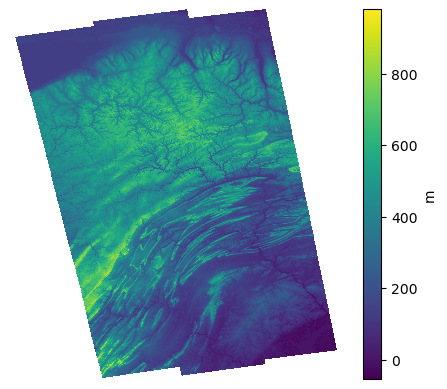

In [29]:
ifg__ = rasterio.open(dates[::2][0])
lon_min, lat_min, lon_max, lat_max = ifg__.bounds
ifg, grid = focus_bound(dates[::2][0], lon_min, lat_min, lon_max,
                            lat_max)
dem, dem_grid = Resamp_rasterio('../InSAR/Pennsylvania/Extracted/DEM/SRTM_3arcsec_uncropped.tif', lon_min,
                                lat_min, lon_max, lat_max, ifg)
mask = ifg==0  
dem[mask] = np.nan
plt.imshow(dem)
plt.colorbar(label='m')
plt.axis('off')
plt.show()

In [30]:
wm = xr.load_dataset('../InSAR/Pennsylvania/WM_files/ERA-5_2020_01_01_T23_00_00_35N_47N_83W_72W.nc')
wm_clip = wm.where((wm.x<lon_max) &(wm.x>lon_min)&(wm.y<lat_max)&(wm.y>lat_min), drop=True)
XY = np.meshgrid(wm_clip.x.values, wm_clip.y.values)
XY[0].shape

(18, 16)

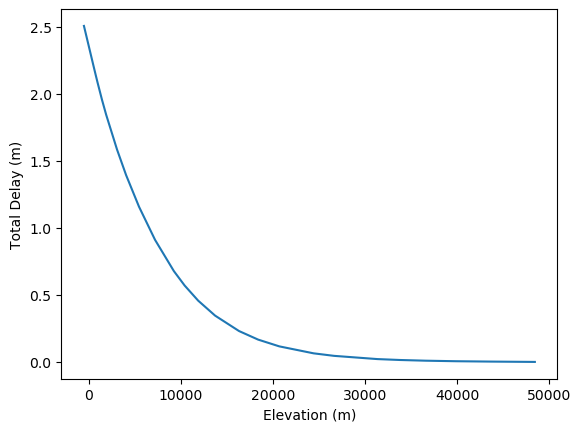

In [31]:
plt.plot(wm_clip.z.values,(wm_clip.hydro_total + wm_clip.wet_total)[:,0,0])
plt.xlabel('Elevation (m)')
plt.ylabel('Total Delay (m)')
plt.show()

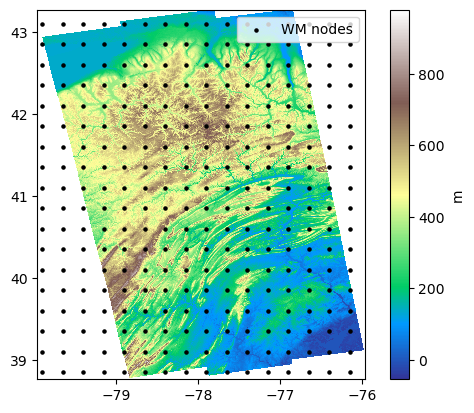

In [32]:
plt.imshow(dem, extent=[lon_min, lon_max, lat_min, lat_max], cmap='terrain')
plt.colorbar(label='m')
plt.scatter(XY[0], XY[1], label='WM nodes', s=5, c='black')
plt.legend()
plt.show()

In [34]:
ifg__ = rasterio.open(dates[::2][0])
lon_min, lat_min, lon_max, lat_max = ifg__.bounds
lon_min, lat_min, lon_max, lat_max

(-79.9608333333334, 38.7641666666667, -75.9608333333334, 43.2716666666667)

Calculate the Tropospheric delay by Neural Network

20200212_20200131


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 11s 1ms/step
20200307_20200224


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step
20200319_20200307


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step
20200331_20200319


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 11s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step
20200412_20200331


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 11s 1ms/step
20200424_20200412


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step
20200506_20200424


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step
20201126_20201114


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


8115/8115 [==============================] - 12s 1ms/step


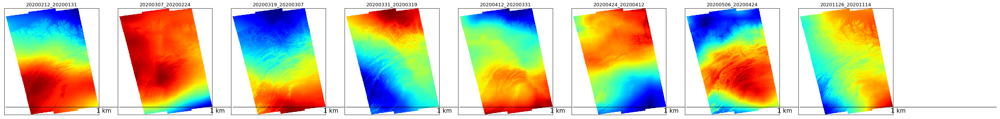

In [36]:
TD_list = []
fig, axes = plt.subplots(1, 8, figsize=(40,15))
for i, date in enumerate(ifg_list):
    print(date)
    # print('Reading in ...')
    ifg, grid = focus_bound(uw_ifg + date, lon_min, lat_min, lon_max,
                            lat_max)
    # print('IFG - done!')
    if i == 0:
        dem, dem_grid = Resamp_rasterio('../InSAR/Pennsylvania/Extracted/DEM/SRTM_3arcsec_uncropped.tif', lon_min,
                                        lat_min, lon_max,
                                        lat_max, ifg)
        # print('DEM - done!')
        mask = ifg==0  
        dem[mask] = np.nan
        los, _ = Resamp_rasterio('../InSAR/Pennsylvania/Angle/los.rdr', lon_min, lat_min, lon_max, lat_max, ifg)
        
    else:
        pass
    
    ifg[~mask] = np.nan
    lon = dem_grid[:,0].reshape(ifg.shape)
    lat = dem_grid[:,-1].reshape(ifg.shape)
  
    # Get date and wm
    date1, date2 = get_datetime(date)
    
    x = lon[::10,::10][0,:]
    x.sort()
    y = lat[::10,::10][:,0]
    y.sort()
    XY = np.meshgrid(x,y)
    # print('Loading Weather model and interp weather model to the right coordinate')
    # print('Day1...')
    with xr.load_dataset(" ".join(glob.glob(weather_file_path + 'ERA-5_{date}_T23_00_00*[A-Z].nc'.format(date=date1)))) as wm:
        # Day1 WM (PTe) parameters
        P1 = wm.p.interp(x=x, y=y, z=hgtlvs)
        T1 = wm.t.interp(x=x, y=y, z=hgtlvs)
        e1 = wm.e.interp(x=x, y=y, z=hgtlvs)
    # print('Done!')
    # print('Day2...')
    with xr.load_dataset(" ".join(glob.glob(weather_file_path + 'ERA-5_{date}_T23_00_00*[A-Z].nc'.format(date=date2)))) as wm:
        # Day1 WM (PTe) parameters
        P2 = wm.p.interp(x=x, y=y, z=hgtlvs)
        T2 = wm.t.interp(x=x, y=y, z=hgtlvs)
        e2 = wm.e.interp(x=x, y=y, z=hgtlvs)
    # print('Done!')
    # print('')
    # print('Make data array for ML prediction...')
    Day_1 = np.hstack((XY[1].reshape(-1, 1), dem[::10,::10].ravel().reshape(-1, 1),
                       np.vstack(P1.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(T1.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(e1.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51)))))
    Day_2 = np.hstack((XY[1].reshape(-1, 1), dem[::10,::10].ravel().reshape(-1, 1),
                       np.vstack(P2.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(T2.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(e2.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51)))))
    # print('Done!')
    # print('')
    # print('Make prediction...')
    predict_day1, predict_day2 = model.predict(scaler.transform(Day_1)), model.predict(scaler.transform(Day_2))
    TD = (predict_day1 - predict_day2).reshape(dem[::10,::10].shape)
    TD = TD / np.cos(np.radians(los[::10,::10]))
    TD_list.append(TD)
    # print('Done!')
    
    axes[i].imshow(TD, cmap='jet')
    axes[i].title.set_text(date)
    scalebar = AnchoredSizeBar(axes[i].transData,
                           1000, '1 km', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fontprops)

    axes[i].add_artist(scalebar)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
plt.show()
    

20200212_20200131


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20200307_20200224


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20200319_20200307


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20200331_20200319


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20200412_20200331


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20200424_20200412


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20200506_20200424


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


20201126_20201114


/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/home/nyv62/miniconda3/envs/RAiDER/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


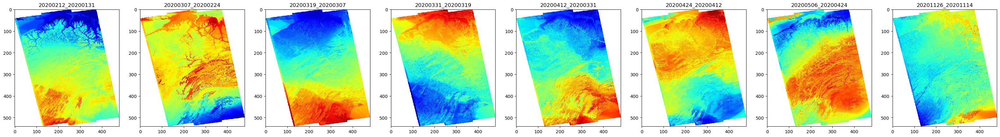

In [17]:
TD_rf_list = []
fig, axes = plt.subplots(1, 8, figsize=(40,15))
for i, date in enumerate(ifg_list):
    print(date)
    # print('Reading in ...')
    ifg, grid = focus_bound(uw_ifg + date, lon_min, lat_min, lon_max,
                            lat_max)
    # print('IFG - done!')
    if i == 0:
        dem, dem_grid = Resamp_rasterio('../InSAR/Pennsylvania/Extracted/DEM/SRTM_3arcsec_uncropped.tif', lon_min,
                                        lat_min, lon_max,
                                        lat_max, ifg)
        # print('DEM - done!')
        mask = ifg==0  
        dem[mask] = np.nan
        los, _ = Resamp_rasterio('../InSAR/Pennsylvania/Angle/los.rdr', lon_min, lat_min, lon_max, lat_max, ifg)
        
    else:
        pass
    # print('LOS - done!')
    # print('DEM: ', dem_grid[0:5])
    # Create a mask for IFG
    
    ifg[~mask] = np.nan
    lon = dem_grid[:,0].reshape(ifg.shape)
    # lon[mask] = np.nan
    lat = dem_grid[:,-1].reshape(ifg.shape)
    # lat[mask] = np.nan
    
    # Get all the x,y coordinate
    # x = list(set(grid[:, 0]))
    # x.sort()
    # y = list(set(grid[:, 1]))
    # y.sort()
    
    # # Get date and wm
    date1, date2 = get_datetime(date)
    
    x = lon[::10,::10][0,:]
    x.sort()
    y = lat[::10,::10][:,0]
    y.sort()
    XY = np.meshgrid(x,y)
    # print('Loading Weather model and interp weather model to the right coordinate')
    # print('Day1...')
    with xr.load_dataset(" ".join(glob.glob(weather_file_path + 'ERA-5_{date}_T23_00_00*[A-Z].nc'.format(date=date1)))) as wm:
        # Day1 WM (PTe) parameters
        P1 = wm.p.interp(x=x, y=y, z=hgtlvs)
        T1 = wm.t.interp(x=x, y=y, z=hgtlvs)
        e1 = wm.e.interp(x=x, y=y, z=hgtlvs)
    # print('Done!')
    # print('Day2...')
    with xr.load_dataset(" ".join(glob.glob(weather_file_path + 'ERA-5_{date}_T23_00_00*[A-Z].nc'.format(date=date2)))) as wm:
        # Day1 WM (PTe) parameters
        P2 = wm.p.interp(x=x, y=y, z=hgtlvs)
        T2 = wm.t.interp(x=x, y=y, z=hgtlvs)
        e2 = wm.e.interp(x=x, y=y, z=hgtlvs)
    # print('Done!')
    # print('')
    # print('Make data array for ML prediction...')
    Day_1 = np.hstack((XY[1].reshape(-1, 1), dem[::10,::10].ravel().reshape(-1, 1),
                       np.vstack(P1.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(T1.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(e1.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51)))))
    Day_2 = np.hstack((XY[1].reshape(-1, 1), dem[::10,::10].ravel().reshape(-1, 1),
                       np.vstack(P2.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(T2.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51))),
                       np.vstack(e2.transpose('y','x','z').values[::-1,:,:].reshape((-1, 51)))))
    # print('Done!')
    # print('')
    # print('Make prediction...')
    Day_1[np. isnan(Day_1)] = 0 
    Day_2[np. isnan(Day_2)] = 0 

    predict_day1, predict_day2 = rf_model.predict(Day_1), rf_model.predict(Day_2)
    TD = (predict_day1 - predict_day2).reshape(dem[::10,::10].shape)
    TD = TD / np.cos(np.radians(los[::10,::10]))
    TD_rf_list.append(TD)
    # print('Done!')
    
    axes[i].imshow(TD, cmap='jet')
    # axes[i].xlabel('Lon')
    # axes[i].ylabel('Lat')
    # axes[i].axis("off")
    # axes[i].colorbar(label='Total Delay (m)')
    axes[i].title.set_text(date)
plt.show()
    

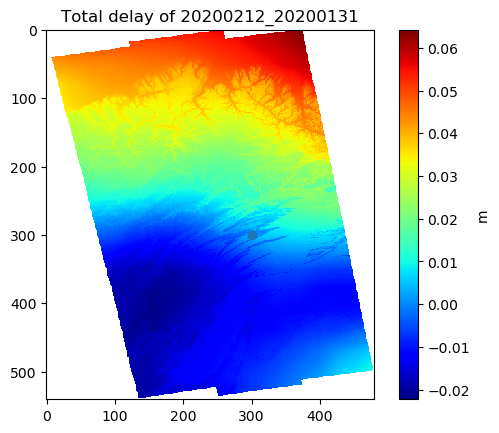

In [37]:
plt.imshow(-TD_list[0] + TD_list[0][300,300] , cmap='jet')
plt.colorbar(label='m')
plt.scatter(300,300,)
plt.title('Total delay of {}'.format(ifg_list[0]))
plt.show()

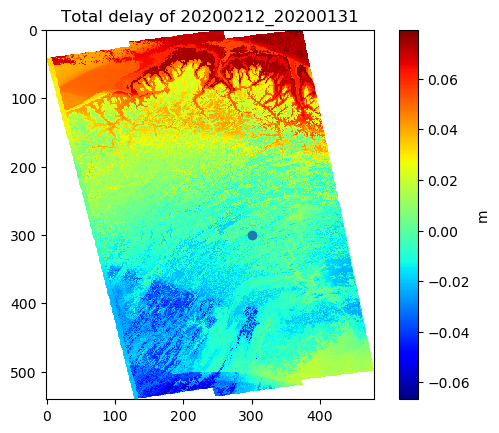

In [18]:
plt.imshow(-TD_rf_list[0] + TD_rf_list[0][300,300] , cmap='jet')
plt.colorbar(label='m')
plt.scatter(300,300,)
plt.title('Total delay of {}'.format(ifg_list[0]))
plt.show()

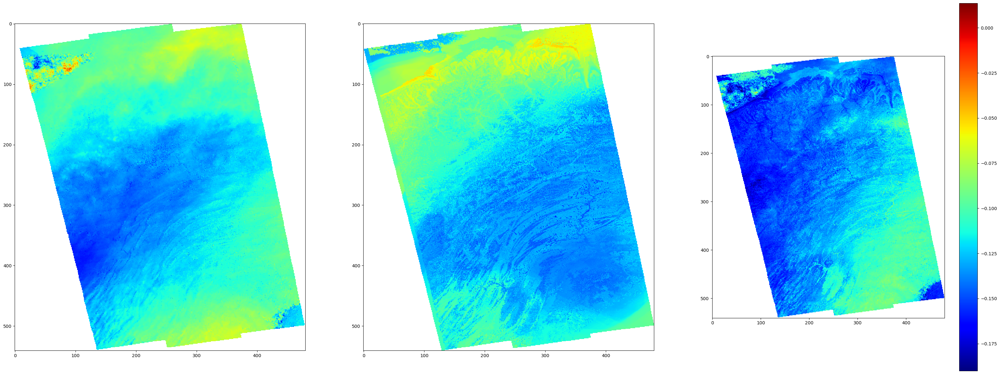

In [19]:
no = 6
fig, axes = plt.subplots(1, 3, figsize=(40,15))
axes[0].imshow(IFG[no][::10,::10] - IFG[no][::10,::10][300,300], cmap='jet')
cax= plt.colorbar(a)
axes[1].imshow(-TD_rf_list[no] + TD_rf_list[no][300,300], cmap='jet', vmin = np.nanmin(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]), vmax = np.nanmax(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]))
axes[2].imshow((IFG[no][::10,::10] + TD_rf_list[no]) - (IFG[no][::10,::10] + TD_rf_list[no])[300,300], cmap='jet', vmin = np.nanmin(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]), vmax = np.nanmax(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]))
plt.show()

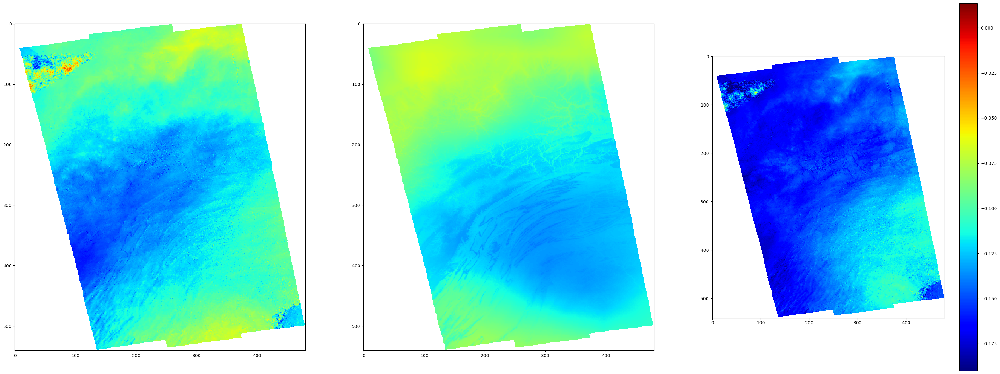

In [38]:
no = 6
fig, axes = plt.subplots(1, 3, figsize=(40,15))
axes[0].imshow(IFG[no][::10,::10] - IFG[no][::10,::10][300,300], cmap='jet')
cax= plt.colorbar(a)
axes[1].imshow(-TD_list[no] + TD_list[no][300,300], cmap='jet', vmin = np.nanmin(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]), vmax = np.nanmax(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]))
mean = np.nanmean((IFG[no][::10,::10] + TD_list[no]) - (IFG[no][::10,::10] + TD_list[no])[300,300])
axes[2].imshow((IFG[no][::10,::10] + TD_list[no]) - (IFG[no][::10,::10] + TD_list[no])[300,300]+mean, cmap='jet', vmin = np.nanmin(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]), vmax = np.nanmax(IFG[no][::10,::10] - IFG[no][::10,::10][300,300]))
plt.show()

In [24]:
np.nanstd((IFG[no][::10,::10] + TD_rf_list[no]) - (IFG[no][::10,::10] + TD_rf_list[no])[300,300]), np.nanstd((IFG[no][::10,::10] + TD_list[no]) - (IFG[no][::10,::10] + TD_list[no])[300,300])

(0.018743170462935946, 0.017774167)

In [25]:
np.nanmean((IFG[no][::10,::10] + TD_rf_list[no]) - (IFG[no][::10,::10] + TD_rf_list[no])[300,300]), np.nanmean((IFG[no][::10,::10] + TD_list[no]) - (IFG[no][::10,::10] + TD_list[no])[300,300])

(0.0011958860311080699, -0.006214465)

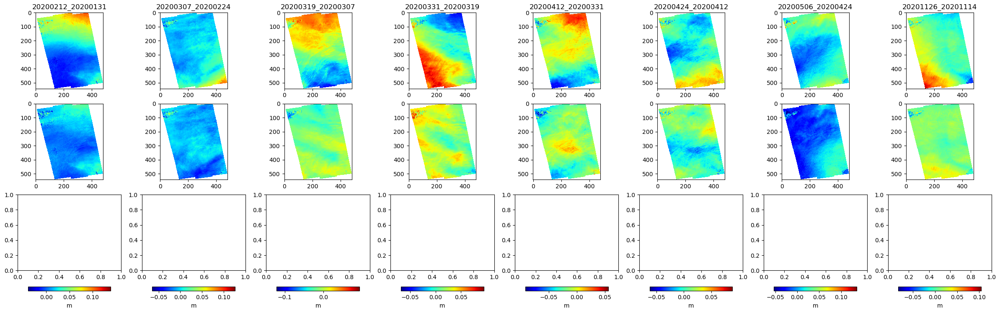

In [39]:
ifg_nn_Corr = []
fig, axes = plt.subplots(2, 8, figsize=(30,10))
for i in range(len(IFG)):
    a = axes[0,i].imshow(IFG[i][::10,::10]-IFG[i][::10,::10][300,300], cmap='jet')
    # plt.colorbar(a, shrink=.7, pad=.05, label='m')
    axes[0,i].title.set_text(ifg_list[i])
    b = axes[1,i].imshow((IFG[i][::10,::10] + TD_list[i]) - (IFG[i][::10,::10] + TD_list[i])[300,300], cmap='jet', vmin = np.nanmin(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    # c = axes[2,i].imshow((IFG[i][::10,::10] + TD_rf_list[i]) - (IFG[i][::10,::10] + TD_rf_list[i])[300,300], cmap='jet', vmin = np.nanmin(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    fig.colorbar(a, ax=axes[:, i], shrink=0.8, pad=0.05, orientation='horizontal', label='m')
    ifg_nn_Corr.append((IFG[i][::10,::10] + TD_list[i]) - (IFG[i][::10,::10] + TD_list[i])[300,300])
plt.show()

In [40]:
RAiDER_list = []
loc = np.hstack((XY[0].reshape(-1,1), XY[1][::-1].reshape(-1,1), dem[::10, ::10].ravel().reshape(-1,1)))
for i, date in enumerate(ifg_list):
    print(date)
    date1, date2 = get_datetime(date)
    with xr.load_dataset(" ".join(glob.glob(weather_file_path + 'ERA-5_{date}_T23_00_00*[A-Z].nc'.format(date=date1)))) as wm:
        hydro_total_1_interp = make_interpretor(wm, 'hydro_total')
        wet_total_1_interp = make_interpretor(wm, 'wet_total')
    with xr.load_dataset(" ".join(glob.glob(weather_file_path + 'ERA-5_{date}_T23_00_00*[A-Z].nc'.format(date=date2)))) as wm:
        hydro_total_2_interp = make_interpretor(wm, 'hydro_total')
        wet_total_2_interp = make_interpretor(wm, 'wet_total')
    
    hydro1 = hydro_total_1_interp(loc).reshape(dem[::10, ::10].shape)
    wet1 = wet_total_1_interp(loc).reshape(dem[::10, ::10].shape)
    hydro2 = hydro_total_2_interp(loc).reshape(dem[::10, ::10].shape)
    wet2 = wet_total_2_interp(loc).reshape(dem[::10, ::10].shape)
    td1 = hydro1 + wet1
    td2 = hydro2 + wet2
    TD = (td1 - td2)/ np.cos(np.radians(los[::10,::10]))
    RAiDER_list.append(TD)

20200212_20200131
20200307_20200224
20200319_20200307
20200331_20200319
20200412_20200331
20200424_20200412
20200506_20200424
20201126_20201114


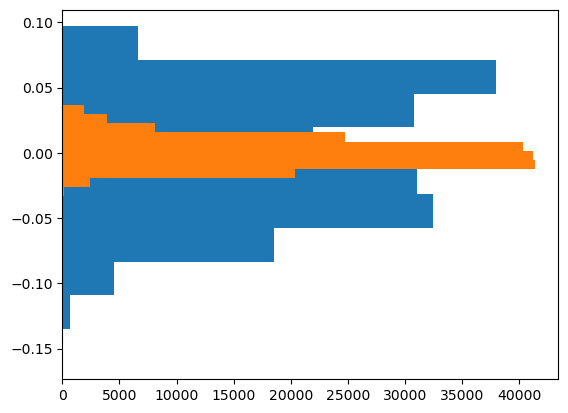

In [89]:
plt.hist((hydro1- np.nanmean(hydro1)).ravel(), orientation='horizontal')
plt.hist((wet1- np.nanmean(wet1)).ravel(), orientation='horizontal')
plt.show()

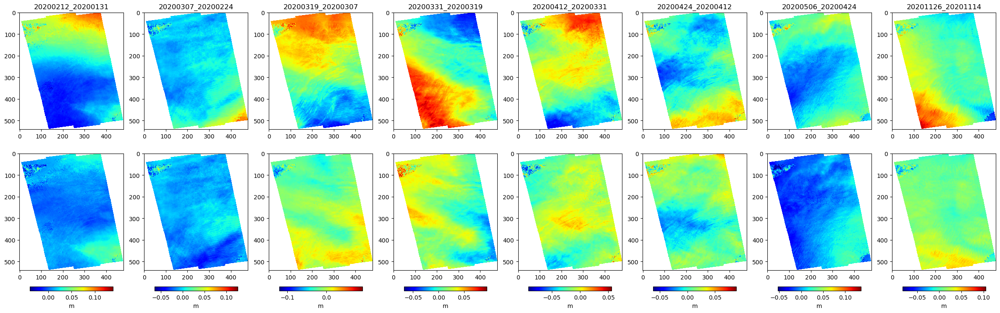

In [42]:
ifg_raider_Corr = []
fig, axes = plt.subplots(2, 8, figsize=(30,10))
for i in range(len(IFG)):
    a = axes[0,i].imshow(IFG[i][::10,::10]-IFG[i][::10,::10][300,300], cmap='jet')
    # plt.colorbar(a, shrink=.7, pad=.05, label='m')
    axes[0,i].title.set_text(ifg_list[i])
    b = axes[1,i].imshow((IFG[i][::10,::10] + RAiDER_list[i]) - (IFG[i][::10,::10] + RAiDER_list[i])[300,300], cmap='jet', vmin = np.nanmin(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    fig.colorbar(a, ax=axes[:, i], shrink=0.8, pad=0.05, orientation='horizontal', label='m')
    ifg_raider_Corr.append((IFG[i][::10,::10] + RAiDER_list[i]) - (IFG[i][::10,::10] + RAiDER_list[i])[300,300])
plt.show()

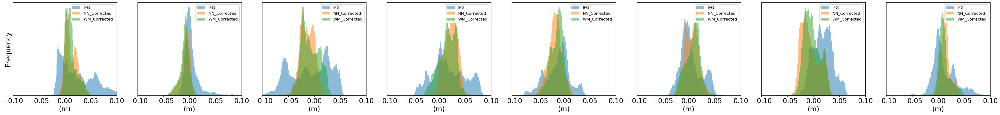

In [71]:
fig, axes = plt.subplots(1,len(IFG), figsize=(52,5))
for no in range(len(IFG)):
    axes[no].hist((IFG[no][::10,::10] - IFG[no][::10,::10][300,300]).ravel(), bins=150, label='IFG', alpha=0.5)
    axes[no].hist(ifg_nn_Corr[no].ravel(), bins=150, label='NN_Corrected', alpha=0.5)
    axes[no].hist(ifg_raider_Corr[no].ravel(), bins=150, label='WM_Corrected', alpha=0.5)
    axes[no].set_xlabel('(m)', fontsize=20)
    if no == 0:
        axes[no].set_ylabel('Frequency', fontsize=20)
    axes[no].tick_params(axis='x', labelsize=20)
    axes[no].set_xlim(-0.1, 0.1)
    # axes[no].title.set_text(ifg_list[no])
    axes[no].set_yticks([])
    axes[no].legend(fontsize=12, loc='upper right')

plt.show()

In [65]:
for i in range(len(IFG)):
    og_ifg_std = np.nanstd((IFG[i][::10,::10])) 
    raider_corr_std = np.nanstd((IFG[i][::10,::10] + RAiDER_list[i]) - (IFG[i][::10,::10] + RAiDER_list[i])[300,300]) 
    nn_corr_std = np.nanstd((IFG[i][::10,::10] + TD_list[i]) - (IFG[i][::10,::10] + TD_list[i])[300,300])
    print(ifg_list[i])
    print('Original ifg std:', og_ifg_std)
    print('RAiDER corrected ifg std:', raider_corr_std)
    print('RAiDER percentage std change:', ((raider_corr_std-og_ifg_std)/og_ifg_std)*100)
    print('Neural Network corrected ifg:', nn_corr_std)
    print('Neural Network percentage std change:', ((nn_corr_std-og_ifg_std)/og_ifg_std)*100)

20200212_20200131
Original ifg std: 0.031480473
RAiDER corrected ifg std: 0.01132562328128397
RAiDER percentage std change: -64.0233377414207
Neural Network corrected ifg: 0.011731597
Neural Network percentage std change: -62.73373365402222
20200307_20200224
Original ifg std: 0.014496532
RAiDER corrected ifg std: 0.009786085905917775
RAiDER percentage std change: -32.493607957781826
Neural Network corrected ifg: 0.009581026
Neural Network percentage std change: -33.90815556049347
20200319_20200307
Original ifg std: 0.037783764
RAiDER corrected ifg std: 0.017723910009521317
RAiDER percentage std change: -53.09120111084209
Neural Network corrected ifg: 0.013783873
Neural Network percentage std change: -63.51906061172485
20200331_20200319
Original ifg std: 0.03168185
RAiDER corrected ifg std: 0.016621364893088755
RAiDER percentage std change: -47.53663500332915
Neural Network corrected ifg: 0.013339303
Neural Network percentage std change: -57.896071672439575
20200412_20200331
Original if

In [96]:
np.nanmax(IFG[0][::10,::10]-IFG[0][::10,::10][300,300])

0.13914019

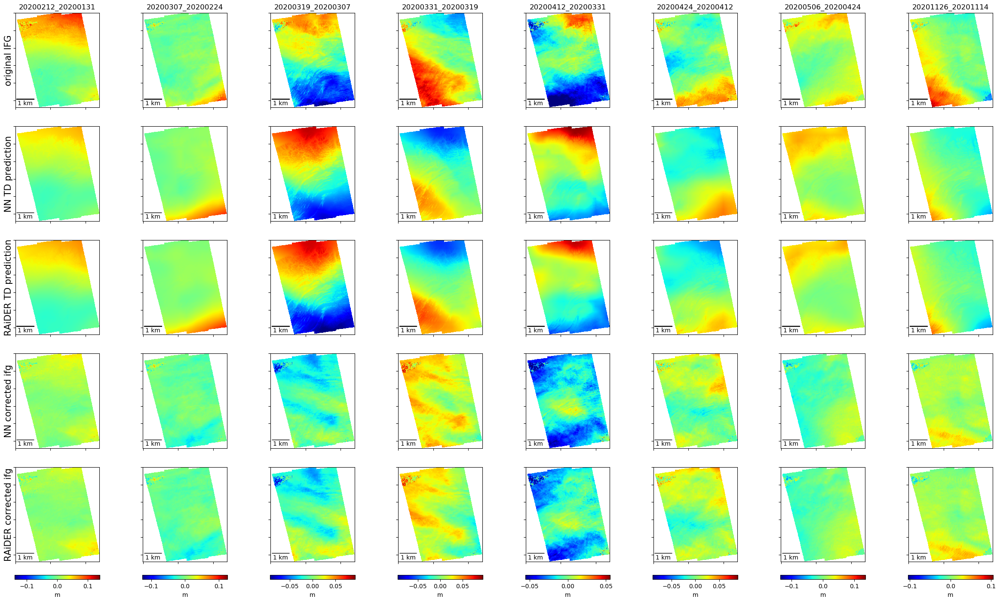

In [76]:
"""
RAiDER_list = List of RAiDER TD prediction of each ifg date
TD_list = List of NN TD prediction of each ifg date
ifg_nn_corr = List of NN corrected ifg of each ifg date
ifg_raider_corr = List of RAiDER corrected ifg of each ifg date
"""
fontprops = fm.FontProperties(size=10)
ifg_raider_corr=[]
fig, axes = plt.subplots(5, 8, figsize=(30,20))
for i in range(len(IFG)):
    a = axes[0,i].imshow(IFG[i][::10,::10]- IFG[i][::10,::10][300,300], cmap='jet', vmin = -np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    axes[0,i].title.set_text(ifg_list[i])
    b = axes[1,i].imshow(-TD_list[i]+TD_list[i][300,300], cmap='jet', vmin = -np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    c = axes[2,i].imshow(-RAiDER_list[i]+RAiDER_list[i][300,300], cmap='jet', vmin = -np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    d = axes[3,i].imshow(ifg_nn_Corr[i], cmap='jet', vmin = -np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]))
    e = axes[4,i].imshow(ifg_raider_Corr[i], cmap='jet', vmin = -np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300]), vmax = np.nanmax(IFG[i][::10,::10]-IFG[i][::10,::10][300,300])) 
    fig.colorbar(a, ax=axes[:, i], shrink=0.8, pad=0.02, orientation='horizontal', label='m')
    if i == 0:
        axes[0,i].set_ylabel('original IFG', fontsize=15)
        axes[1,i].set_ylabel('NN TD prediction',fontsize=15)
        axes[2,i].set_ylabel('RAiDER TD prediction', fontsize=15)
        axes[3,i].set_ylabel('NN corrected ifg', fontsize=15)
        axes[4,i].set_ylabel('RAiDER corrected ifg', fontsize=15)
    else:
        pass
    
    for c in range(0,5):
        axes[c,i].xaxis.set_tick_params(labelbottom=False)
        axes[c,i].yaxis.set_tick_params(labelleft=False)
        scalebar = AnchoredSizeBar(axes[c, i].transData,
                           100, '1 km', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fontprops)

        axes[c,i].add_artist(scalebar)
plt.savefig('Plots/Pennsylvania/Penn_examp_ifg_corr_cleaned.png', dpi=600)
plt.show()